In [ ]:
import os
import random
import shutil
import gdown
import zipfile
import numpy as np
import keras
import matplotlib.pyplot as plt
import tensorflow as tf
import sys

from google.colab import files
from tensorflow.keras import utils

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB1
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

In [ ]:
# Print versi TensorFlow
print(f"TensorFlow version: {tf.__version__}")

# Print versi Keras
print(f"Keras version: {keras.__version__}")

# Print versi NumPy
print(f"NumPy version: {np.__version__}")

# Print versi Matplotlib
print(f"Matplotlib version: {plt.matplotlib.__version__}")

# Print versi Python
print(f"Python version: {sys.version}")

TensorFlow version: 2.15.0
Keras version: 2.15.0
NumPy version: 1.25.2
Matplotlib version: 3.7.1
Python version: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]


In [ ]:
# URL Google Drive
url = 'https://drive.google.com/uc?id=1oFR_YMJxHd00L0K5ZE11obEu5wpRPcvS'
output = '/content/dataset.zip'

# Unduh file
gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1oFR_YMJxHd00L0K5ZE11obEu5wpRPcvS
From (redirected): https://drive.google.com/uc?id=1oFR_YMJxHd00L0K5ZE11obEu5wpRPcvS&confirm=t&uuid=fcf10cbd-ae2b-4ef6-88a7-6b4f3bb94c55
To: /content/dataset.zip
100%|██████████| 991M/991M [00:04<00:00, 208MB/s]


'/content/dataset.zip'

In [ ]:
# Ekstrak file zip
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall('/content/dataset')

# Path dataset yang sudah di-download
dataset_path = '/content/dataset/fruit_dataset'

In [ ]:
# Ambil label dari direktori dataset
labels = sorted([name for name in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, name))])

# Hitung jumlah kelas (num_classes)
num_classes = len(labels)

# Buat dictionary untuk mapping label dari index 0
label_indices = {label: index for index, label in enumerate(labels)}

# Print label dengan indexnya
for label, index in label_indices.items():
    print(f"{label} = {index}")

# Cetak jumlah kelas
print("Number of classes:", num_classes)

almonds = 0
apple = 1
apricot = 2
avocado = 3
banana = 4
blueberry = 5
brazil nuts = 6
cantaloupe = 7
carambola = 8
cashews = 9
cherry = 10
clementine = 11
coconut = 12
dates = 13
dragon fruit = 14
durian = 15
fig = 16
grape = 17
grapefruit = 18
guava = 19
hazelnut = 20
kiwi = 21
kumquats = 22
lemon = 23
limes = 24
lychee = 25
macadamia = 26
mango = 27
mangostan = 28
orange = 29
papaya = 30
passion fruit = 31
peach = 32
peanut = 33
pear = 34
pecans = 35
pineapple = 36
pomegranate = 37
rambutan = 38
raspberry = 39
strawberry = 40
tamarillo = 41
tangelo = 42
watermelon = 43
Number of classes: 44


In [ ]:
# Path untuk folder baru (fruit_dataset)
base_dir = '/content/fruit'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Buat folder baru jika belum ada
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

In [ ]:
# Fungsi untuk membagi dataset ke dalam train, val, dan test
def split_dataset(class_name, images, train_ratio=0.6, val_ratio=0.2):
    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)

    train_split = int(train_ratio * len(images))
    val_split = int((train_ratio + val_ratio) * len(images))

    train_images = images[:train_split]
    val_images = images[train_split:val_split]
    test_images = images[val_split:]

    for img in train_images:
        shutil.copy(os.path.join(dataset_path, class_name, img), os.path.join(train_dir, class_name, img))
    for img in val_images:
        shutil.copy(os.path.join(dataset_path, class_name, img), os.path.join(val_dir, class_name, img))
    for img in test_images:
        shutil.copy(os.path.join(dataset_path, class_name, img), os.path.join(test_dir, class_name, img))

In [ ]:
# Proses pemisahan dataset
for label in labels:
    images = os.listdir(os.path.join(dataset_path, label))
    random.shuffle(images)  # Acak gambar sebelum membagi
    split_dataset(label, images)

In [ ]:
# Augmentasi menggunakan ImageDataGenerator
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.4, 1.9],
    fill_mode='nearest'
)

val_test_datagen = ImageDataGenerator()  # Tanpa augmentasi untuk validation dan test


In [ ]:
# Dimensi gambar input untuk EficientNet (224x224)
img_size = (224, 224)
batch_size = 32

# Iterator untuk data train, val, dan test
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    classes=labels,
    shuffle=True
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    classes=labels,
    shuffle=False
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    classes=labels,
    shuffle=False
)

Found 27187 images belonging to 44 classes.
Found 9062 images belonging to 44 classes.
Found 9064 images belonging to 44 classes.


In [ ]:
# Load pre-trained EfficientNetB0 tanpa top layers (include_top=False)
base_model = EfficientNetB1(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

27018416/27018416 [==============================] - 0s 0us/step


In [ ]:
# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
# Membangun model
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
])

In [ ]:
# Compile model
model.compile(optimizer=Adam(),  # Default learning rate Adam optimizer
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
callbacks = [
    ModelCheckpoint('/content/model_checkpoint.keras', save_best_only=True, monitor='val_accuracy', mode='max'),
    ReduceLROnPlateau(monitor='val_accuracy', factor=0.2, patience=5, min_lr=1e-6)
]

In [ ]:
# Pelatihan model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=50,
    validation_data=val_generator,
    validation_steps=val_generator.samples // batch_size,
    callbacks=callbacks,
)

Epoch 1/50
849/849 [==============================] - 369s 419ms/step - loss: 1.2818 - accuracy: 0.6368 - val_loss: 0.6396 - val_accuracy: 0.8092 - lr: 0.0010
Epoch 2/50
849/849 [==============================] - 353s 416ms/step - loss: 0.8621 - accuracy: 0.7413 - val_loss: 0.5611 - val_accuracy: 0.8306 - lr: 0.0010
Epoch 3/50
849/849 [==============================] - 352s 414ms/step - loss: 0.7662 - accuracy: 0.7697 - val_loss: 0.5060 - val_accuracy: 0.8484 - lr: 0.0010
Epoch 4/50
849/849 [==============================] - 351s 413ms/step - loss: 0.6986 - accuracy: 0.7885 - val_loss: 0.4976 - val_accuracy: 0.8528 - lr: 0.0010
Epoch 5/50
849/849 [==============================] - 354s 417ms/step - loss: 0.6648 - accuracy: 0.7985 - val_loss: 0.4691 - val_accuracy: 0.8611 - lr: 0.0010
Epoch 6/50
849/849 [==============================] - 351s 414ms/step - loss: 0.6345 - accuracy: 0.8076 - val_loss: 0.4679 - val_accuracy: 0.8585 - lr: 0.0010
Epoch 7/50
849/849 [==========================

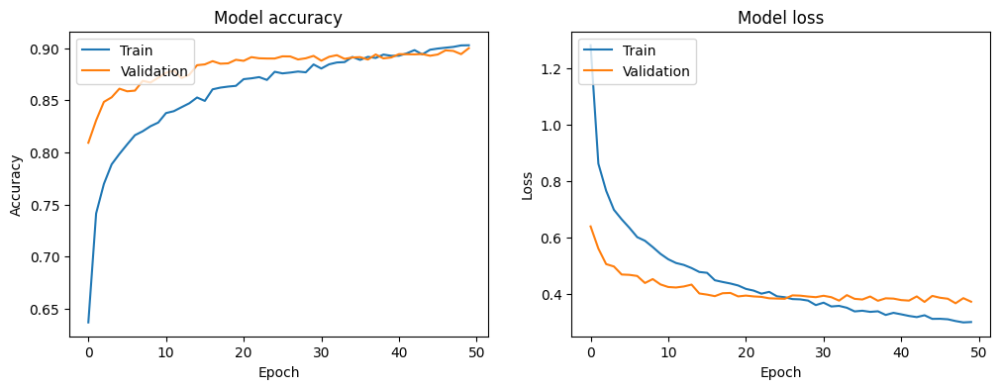

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.show()

In [ ]:
# Menyimpan model dalam format HDF5
model.save('model.h5')

# Menyimpan model dalam format TensorFlow SavedModel
model.save('saved_model/')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# Load model
loaded_model = load_model('model.h5')

In [ ]:
# Ambil log dari pelatihan yang tersimpan
training_log = history.history

# Ambil nilai akhir dari akurasi dan loss
final_accuracy = training_log['accuracy'][-1]
final_loss = training_log['loss'][-1]

# Tampilkan nilai akhir
print(f'Accuracy: {final_accuracy:.4f}')
print(f'Loss: {final_loss:.4f}')

Accuracy: 0.9027
Loss: 0.3007


1/1 [==============================] - 0s 29ms/step


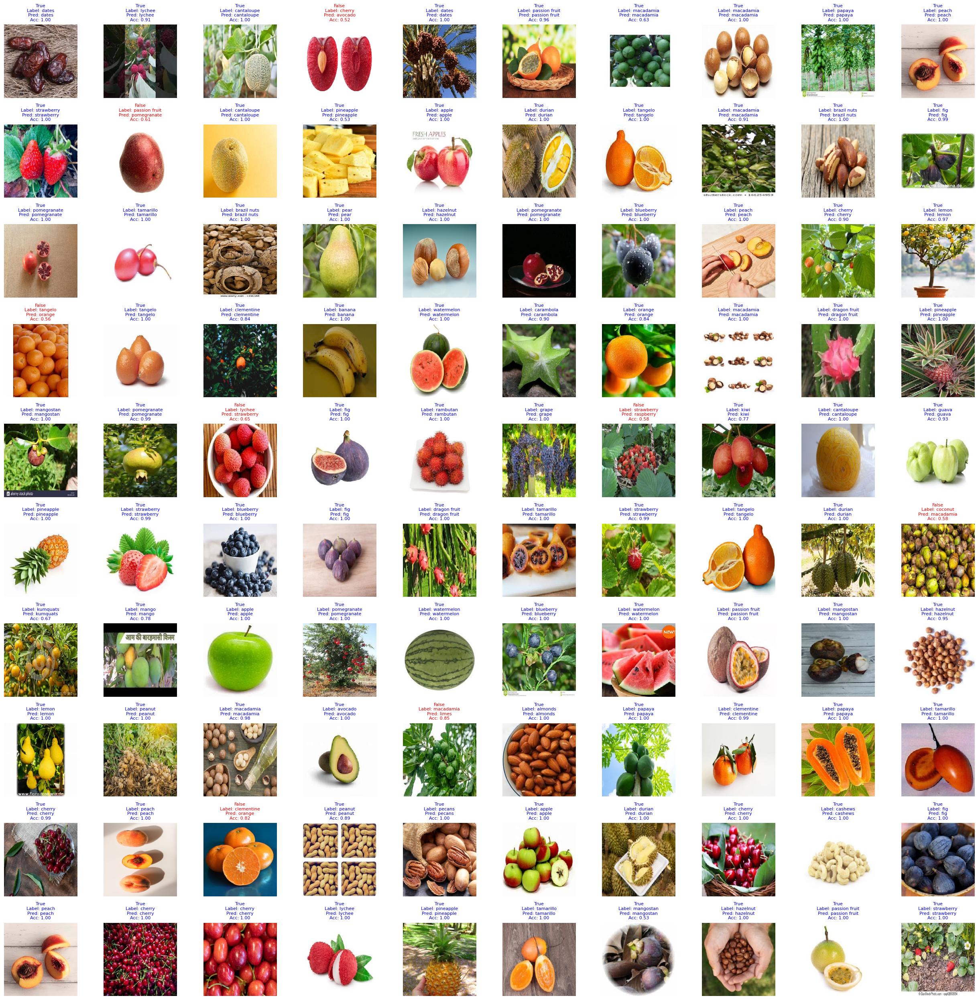

In [ ]:
# Pilih 10 gambar random
random_indices = random.sample(range(len(test_generator.filenames)), 100)

row = 10
col = 10

plt.figure(figsize=(col*2.5, row*2.5))

for i, index in enumerate(random_indices):
    # Muat gambar dan preprocessing
    img_path = os.path.join(test_dir, test_generator.filenames[index])
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    label_indices = [k for k, v in test_generator.class_indices.items()]

    # Prediksi gambar
    prediction = loaded_model.predict(img_array)
    predicted_label_index = np.argmax(prediction)
    predicted_label = label_indices[predicted_label_index]

    # Label asli
    true_label = test_generator.filenames[index].split('/')[0]

    # Menampilkan gambar dengan label
    plt.subplot(row, col, i + 1)
    plt.imshow(img)
    # plt.title(f"True: {true_label}\nPred: {predicted_label}\nAcc: {prediction[0][predicted_label_index]:.2f}")
    if predicted_label == true_label:
        plt.title(f"True\nLabel: {true_label}\nPred: {predicted_label}\nAcc: {prediction[0][predicted_label_index]:.2f}", color="blue", fontsize=8)
    else:
        plt.title(f"False\nLabel: {true_label}\nPred: {predicted_label}\nAcc: {prediction[0][predicted_label_index]:.2f}", color="red", fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

Saving pohon.jpg to pohon (2).jpg
1/1 [==============================] - 0s 33ms/step


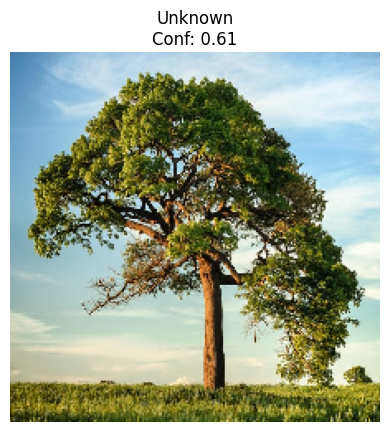

In [ ]:
# Upload images
uploaded = files.upload()

for fn in uploaded.keys():
    # Predicting images
    path = '/content/' + fn
    img = utils.load_img(path, target_size=(224, 224))
    x = utils.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0  # Normalize the image

    # Predict
    predictions = loaded_model.predict(x, batch_size=10)
    confidence = np.max(predictions[0])
    predicted_label_index = np.argmax(predictions[0])

    plt.imshow(img)
    if confidence < 0.9:
        plt.title(f"Unknown\nConf: {confidence:.2f}")
    else:
        predicted_label = labels[predicted_label_index]
        plt.title(f"{predicted_label}\nConf: {confidence:.2f}")
    plt.axis('off')
    plt.show()

Saving penyakit-kanker.jpg to penyakit-kanker (3).jpg
1/1 [==============================] - 0s 29ms/step


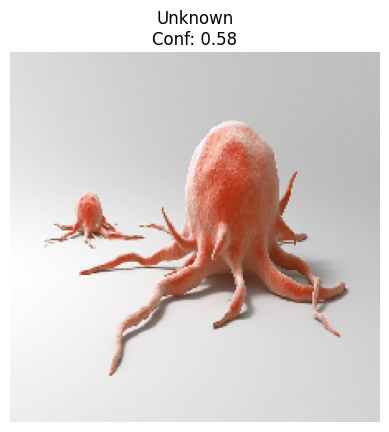

In [ ]:
# Upload images
uploaded = files.upload()

for fn in uploaded.keys():
    # Predicting images
    path = '/content/' + fn
    img = utils.load_img(path, target_size=(224, 224))
    x = utils.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0  # Normalize the image

    # Predict
    predictions = loaded_model.predict(x, batch_size=10)
    confidence = np.max(predictions[0])
    predicted_label_index = np.argmax(predictions[0])

    plt.imshow(img)
    if confidence < 0.9:
        plt.title(f"Unknown\nConf: {confidence:.2f}")
    else:
        predicted_label = labels[predicted_label_index]
        plt.title(f"{predicted_label}\nConf: {confidence:.2f}")
    plt.axis('off')
    plt.show()

Saving dog.png to dog.png
1/1 [==============================] - 0s 29ms/step


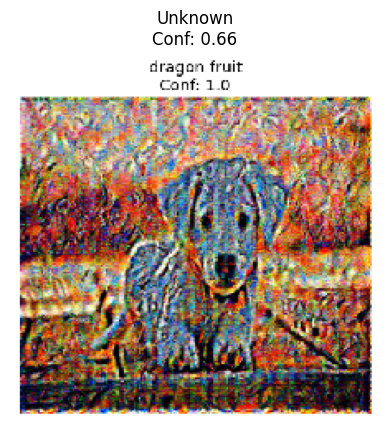

In [ ]:
# Upload images
uploaded = files.upload()

for fn in uploaded.keys():
    # Predicting images
    path = '/content/' + fn
    img = utils.load_img(path, target_size=(224, 224))
    x = utils.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0  # Normalize the image

    # Predict
    predictions = loaded_model.predict(x, batch_size=10)
    confidence = np.max(predictions[0])
    predicted_label_index = np.argmax(predictions[0])

    plt.imshow(img)
    if confidence < 0.9:
        plt.title(f"Unknown\nConf: {confidence:.2f}")
    else:
        predicted_label = labels[predicted_label_index]
        plt.title(f"{predicted_label}\nConf: {confidence:.2f}")
    plt.axis('off')
    plt.show()

Saving macaroni.jpg to macaroni.jpg
1/1 [==============================] - 0s 29ms/step


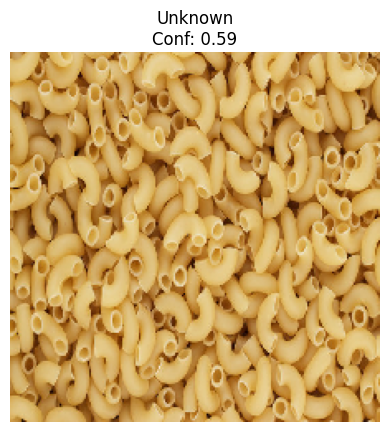

In [ ]:
# Upload images
uploaded = files.upload()

for fn in uploaded.keys():
    # Predicting images
    path = '/content/' + fn
    img = utils.load_img(path, target_size=(224, 224))
    x = utils.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = x / 255.0  # Normalize the image

    # Predict
    predictions = loaded_model.predict(x, batch_size=10)
    confidence = np.max(predictions[0])
    predicted_label_index = np.argmax(predictions[0])

    plt.imshow(img)
    if confidence < 0.9:
        plt.title(f"Unknown\nConf: {confidence:.2f}")
    else:
        predicted_label = labels[predicted_label_index]
        plt.title(f"{predicted_label}\nConf: {confidence:.2f}")
    plt.axis('off')
    plt.show()

Saving kiwi.jpeg to kiwi (1).jpeg
1/1 [==============================] - 0s 29ms/step
[1.85936266e-10 1.09758225e-09 1.83492022e-09 1.45596113e-09
 1.44034631e-10 3.81586082e-11 4.41924470e-08 2.99847642e-07
 3.02528225e-10 9.01002688e-13 1.45528797e-11 1.34736736e-11
 1.71427260e-07 2.58906896e-09 2.77988361e-11 8.48642601e-10
 1.16716853e-11 3.26671884e-11 4.44530812e-08 1.03336249e-10
 4.61078997e-09 9.99999523e-01 1.69072936e-10 7.78630938e-09
 1.64993352e-09 2.69703461e-11 5.87461235e-09 2.88174107e-08
 4.14345259e-11 4.81046973e-11 9.31336258e-12 7.80827492e-09
 1.02569320e-12 9.11189353e-12 2.31991049e-09 3.52707086e-10
 1.63154087e-10 1.09323748e-11 2.64023716e-11 3.86958044e-13
 3.44635015e-11 4.18277357e-11 2.18956117e-10 1.05843143e-13]


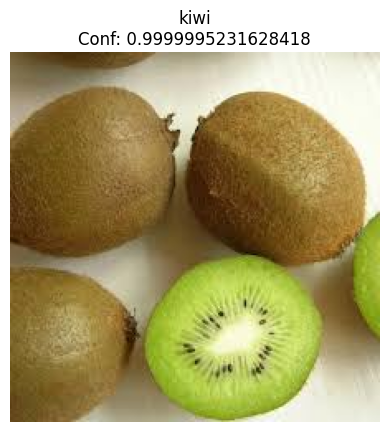

In [ ]:
# Upload images
uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  path = '/content/' + fn
  img = utils.load_img(path, target_size=(224, 224))
  x = utils.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = loaded_model.predict(images, batch_size=10)
  print(classes[0])
  plt.imshow(img)
  if np.max(classes) < 0.9 :
    plt.title(f"Unknown\nConf: {np.max(classes[0])}")
  else:
    plt.title(f"{labels[np.argmax(classes[0])]}\nConf: {np.max(classes[0])}")
  plt.axis('off')
  plt.show()

Saving kiwi.jpg to kiwi (2).jpg
1/1 [==============================] - 0s 30ms/step
[3.64955014e-07 1.16480787e-05 3.06972154e-08 7.63624441e-03
 3.03756138e-07 6.54202950e-06 2.78817970e-06 2.86064912e-02
 3.41841201e-07 4.79222945e-06 1.46302924e-07 5.82230132e-05
 3.51162185e-03 1.02658641e-05 3.38245854e-07 5.71537566e-05
 3.47698660e-04 2.28903847e-08 7.37422160e-05 2.08837537e-06
 1.36427325e-05 9.57458496e-01 5.94663220e-07 7.29990497e-05
 2.94757134e-04 3.37761662e-07 7.59108332e-07 3.17805025e-05
 1.93831329e-05 4.48641504e-06 1.02936565e-05 7.57869259e-07
 2.80714030e-05 5.40509895e-08 1.18857203e-03 1.97400363e-09
 4.91685350e-04 2.20243859e-08 4.76690257e-05 1.13743495e-08
 5.13436134e-07 4.32360459e-08 4.20480319e-07 3.74957335e-06]


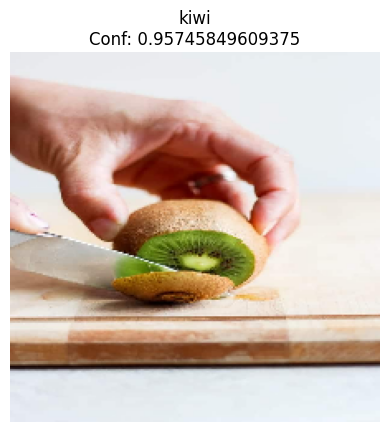

In [ ]:
# Upload images
uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  path = '/content/' + fn
  img = utils.load_img(path, target_size=(224, 224))
  x = utils.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = loaded_model.predict(images, batch_size=10)
  print(classes[0])
  plt.imshow(img)
  if np.max(classes) < 0.9 :
    plt.title(f"Unknown\nConf: {np.max(classes[0])}")
  else:
    plt.title(f"{labels[np.argmax(classes[0])]}\nConf: {np.max(classes[0])}")
  plt.axis('off')
  plt.show()

Saving melon.jpg to melon (2).jpg
1/1 [==============================] - 0s 29ms/step
[2.16871483e-13 8.22474413e-15 4.72944739e-11 1.93501193e-09
 9.62594465e-14 2.17228335e-13 1.53036199e-12 1.00000000e+00
 3.56942394e-14 4.90472983e-12 3.77057570e-13 4.67362965e-13
 5.76074724e-13 3.15850183e-13 2.42461335e-14 1.24625909e-11
 3.08214744e-13 2.16355212e-15 1.21146604e-12 1.23591092e-13
 1.02143391e-12 8.03202851e-11 7.30254670e-13 9.06865186e-13
 5.87679658e-14 3.29470935e-15 1.95520886e-13 2.44705000e-13
 6.07084226e-15 9.82475277e-14 7.65609887e-09 2.92761692e-14
 1.01058715e-13 3.15830769e-14 3.15037357e-13 4.69421966e-14
 2.17901634e-11 2.22920040e-16 1.83429961e-15 3.36329308e-16
 1.37584951e-14 1.40315162e-10 5.72032276e-13 3.34483934e-11]


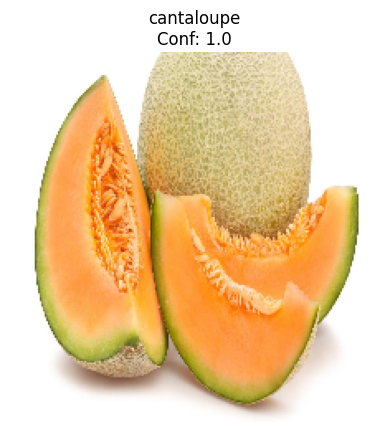

In [ ]:
# Upload images
uploaded = files.upload()

for fn in uploaded.keys():

  # predicting images
  path = '/content/' + fn
  img = utils.load_img(path, target_size=(224, 224))
  x = utils.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = loaded_model.predict(images, batch_size=10)
  print(classes[0])
  plt.imshow(img)
  if np.max(classes) < 0.9 :
    plt.title(f"Unknown\nConf: {np.max(classes[0])}")
  else:
    plt.title(f"{labels[np.argmax(classes[0])]}\nConf: {np.max(classes[0])}")
  plt.axis('off')
  plt.show()